In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from scipy.spatial import distance

In [2]:
def detect_key_points(img):
  akaze = cv.AKAZE_create()
  return akaze.detectAndCompute(img, None)

In [3]:
def bf_matcher(img1, img2):
  kp1, des1 = detect_key_points(img1)
  kp2, des2 = detect_key_points(img2)

  bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
  matches = bf.match(des1, des2)
  matches = sorted(matches, key=lambda x:x.distance)

  return cv.drawMatches(img1, kp1, img2, kp2, matches[:10], None, flags=2)

In [4]:
def custom_matcher(img1, img2):
  kp1, des1 = detect_key_points(img1)
  kp2, des2 = detect_key_points(img2)
  matches = []
  for i in range(des1.shape[0]):
    for j in range(des2.shape[0]):
      matches.append(cv.DMatch(_queryIdx=i, _trainIdx=j, _distance=distance.hamming(des1[i], des2[j])))

  matches = sorted(matches, key=lambda x: x.distance)

  return cv.drawMatches(img1, kp1, img2, kp2, matches[:10], None, flags=2)

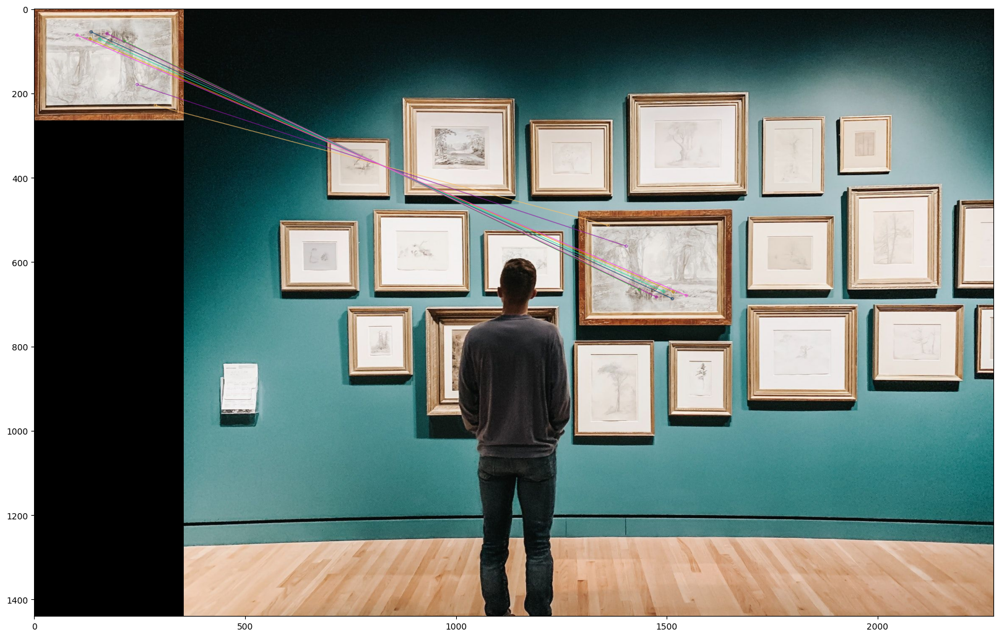

In [6]:
img2 = cv.cvtColor(cv.imread('img2.jpg'), cv.COLOR_BGR2RGB)
img2_mod = cv.cvtColor(cv.imread('img2_modified.jpg'), cv.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(bf_matcher(img2_mod, img2))
plt.show()

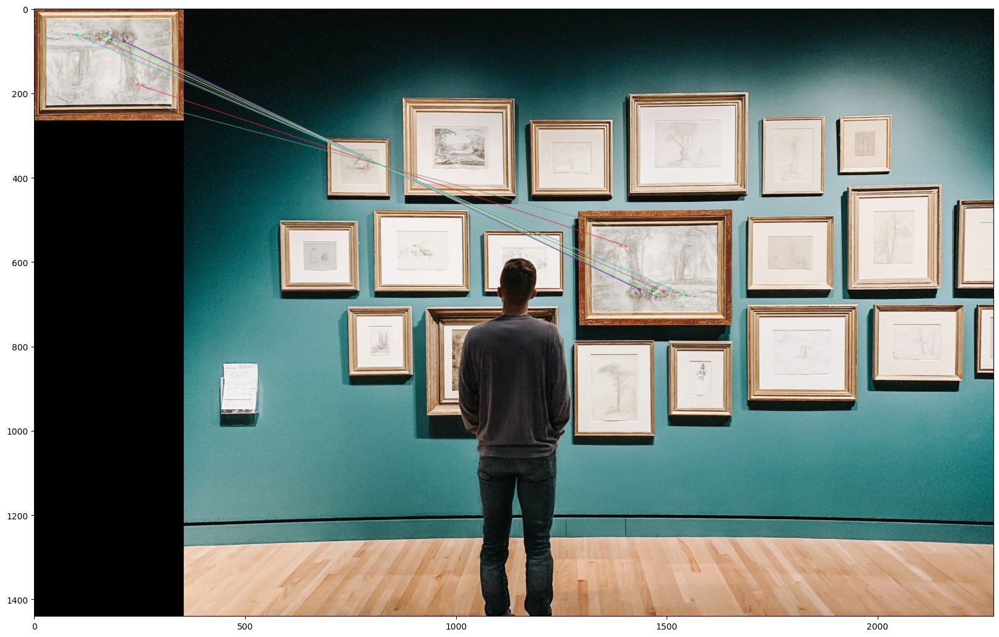

In [5]:
img2 = cv.cvtColor(cv.imread('img2.jpg'), cv.COLOR_BGR2RGB)
img2_mod = cv.cvtColor(cv.imread('img2_modified.jpg'), cv.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(custom_matcher(img2_mod, img2))
plt.show()

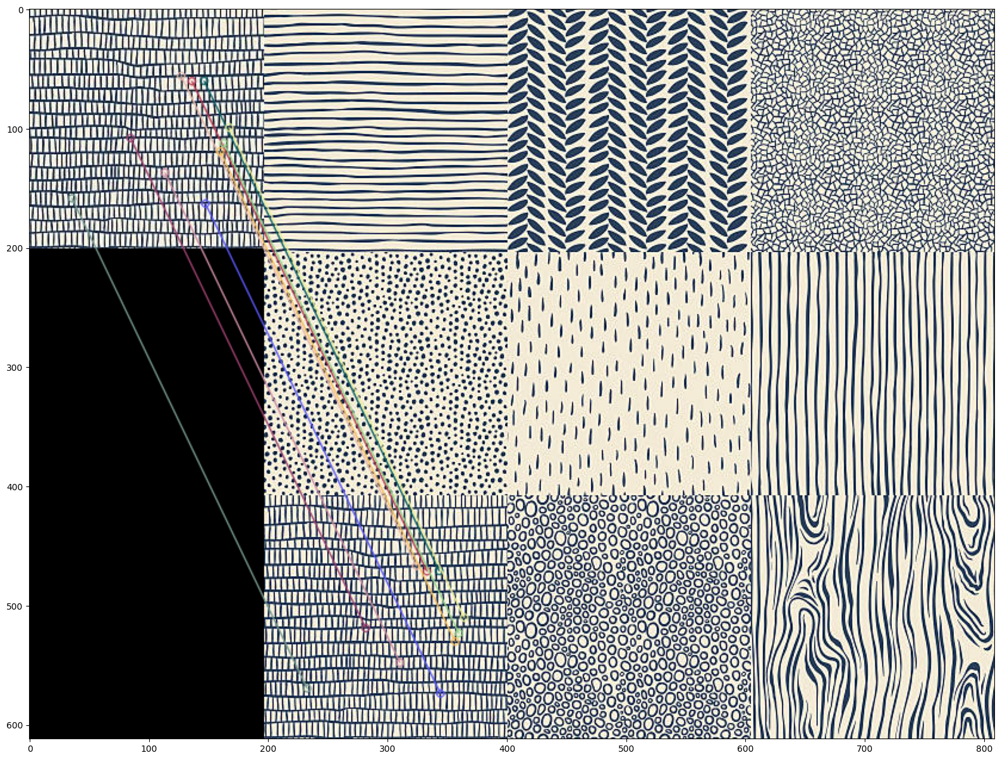

In [7]:
img1 = cv.cvtColor(cv.imread('img1.jpg'), cv.COLOR_BGR2RGB)
img1_mod = cv.cvtColor(cv.imread('img1_modified.jpg'), cv.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(bf_matcher(img1_mod, img1))
plt.show()

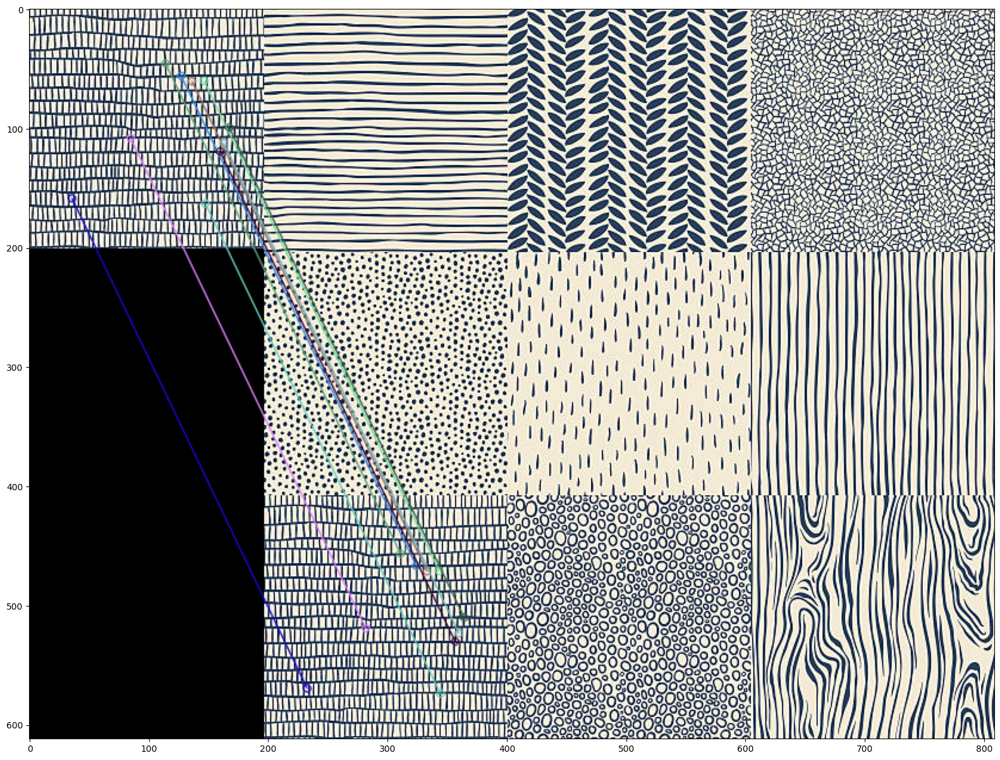

In [8]:
img1 = cv.cvtColor(cv.imread('img1.jpg'), cv.COLOR_BGR2RGB)
img1_mod = cv.cvtColor(cv.imread('img1_modified.jpg'), cv.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(custom_matcher(img1_mod, img1))
plt.show()